# Notebook to run basic `scanpy` QC and doublet detection with `scrublet`

- **Developed by**: Carlos Talavera-López PhD
- **Modified by** : Srivalli Kolla
- **Modification date** : 23 May, 2024
- **Würzburg Institute for Systems Immunology & Julius-Maximilian-Universität Würzburg**

## Load required modules

In [12]:
import anndata
import logging
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb
import scrublet as scr
import time
import matplotlib.pyplot as plt
from statsmodels.robust.scale import mad as median_abs_deviation
from matplotlib import colors
from matplotlib import rcParams

In [13]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')
timestamp = time.strftime("%d_%m_%Y")

-----
anndata     0.10.7
scanpy      1.10.1
-----
PIL                 10.3.0
annoy               NA
argcomplete         NA
asttokens           NA
colorama            0.4.6
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0
debugpy             1.8.1
decorator           5.1.1
executing           2.0.1
h5py                3.11.0
igraph              0.11.5
ipykernel           6.29.3
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
lazy_loader         0.4
legacy_api_wrap     NA
leidenalg           0.10.2
llvmlite            0.42.0
matplotlib          3.8.4
matplotlib_inline   0.1.7
mpl_toolkits        NA
natsort             8.4.0
numba               0.59.1
numpy               1.26.4
packaging           24.0
pandas              2.2.2
parso               0.8.4
patsy               0.5.6
pickleshare         0.7.5
platformdirs        4.2.2
prompt_toolkit      3.0.46
psutil              5.9.8
pure_eval           0.2.

In [107]:
path = '/home/cartalop/Downloads/'

## Read `anndata` objects

In [15]:
adata = sc.read_h5ad('/home/cartalop/PSP35_CD45_seurat_unprocessed.h5ad')
adata

AnnData object with n_obs × n_vars = 9177 × 32285
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_CITE', 'nFeature_CITE', 'percent.mt'
    var: 'name'

In [16]:
adata.obs

,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,nCount_CITE,nFeature_CITE,percent.mt
AAACCTGAGAACTCGG-1,1926.0,847,442.0,8,87.0,4,0.000000
AAACCTGAGAGGTTGC-1,1889.0,1161,723.0,8,98.0,4,1.588142
AAACCTGAGCTACCTA-1,1273.0,768,572.0,8,68.0,4,0.078555
AAACCTGAGGAGCGTT-1,1208.0,721,1092.0,8,81.0,4,1.903974
AAACCTGAGGCACATG-1,2660.0,1369,2746.0,8,128.0,4,1.654135
...,...,...,...,...,...,...,...
TTTGTCACAGCATGAG-1,4772.0,1664,2105.0,8,92.0,4,0.000000
TTTGTCACATCTGGTA-1,515.0,410,1813.0,8,147.0,4,4.466019
TTTGTCACATTCTCAT-1,2861.0,1051,1625.0,8,108.0,4,0.104858
TTTGTCATCCAAGCCG-1,8934.0,2934,667.0,7,113.0,4,1.399149


In [17]:
adata.var

,name
Xkr4,Xkr4
Gm1992,Gm1992
Gm19938,Gm19938
Gm37381,Gm37381
Rp1,Rp1
...,...
AC124606.1,AC124606.1
AC133095.2,AC133095.2
AC133095.1,AC133095.1
AC234645.1,AC234645.1


In [18]:
adata.obs['nFeature_HTO'].unique()

array([8, 7, 6, 5, 4, 2], dtype=int32)

In [19]:
adata.obs['sample'] = adata.obs['nFeature_HTO'].copy()

In [20]:
adata

AnnData object with n_obs × n_vars = 9177 × 32285
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_CITE', 'nFeature_CITE', 'percent.mt', 'sample'
    var: 'name'

In [21]:
adata.obs['sample'].value_counts()

sample
8    8633
7     506
6      29
5       7
4       1
2       1
Name: count, dtype: int64

## Doublet score prediction

#### Steps followed

Make a loop to work on all the samples

1. List of samples
2. Subsetting samples based on sample_name
3. Doublet score calculation
4. Assign doublet scores to the sample
5. Plotting

In [22]:
# Ensure 'sample' column exists in obs and is properly set
if 'sample' not in adata.obs:
    adata.obs['sample'] = adata.obs['nFeature_HTO'].copy()  # Or set 'sample' based on your specific criteria

# Extract unique sample names
sample_names = adata.obs['sample'].unique()

# Iterate over each sample
for sample_name in sample_names:
    mask = adata.obs['sample'] == sample_name
    sample_adata = adata[mask].copy()

    # Remove genes with all zero counts
    sc.pp.filter_genes(sample_adata, min_counts=1)

    # Remove cells with very few counts
    sc.pp.filter_cells(sample_adata, min_counts=10)

    # Check if any features are left after filtering
    if sample_adata.shape[1] == 0 or sample_adata.shape[0] == 0:
        print(f"Skipping sample {sample_name} due to insufficient features or cells after filtering.")
        continue

    # Convert to dense matrix if needed
    if isinstance(sample_adata.X, np.matrix) or isinstance(sample_adata.X, np.ndarray):
        dense_matrix = sample_adata.X
    else:
        dense_matrix = sample_adata.X.todense()

    # Check for and handle infinite or NaN values
    if np.any(np.isinf(dense_matrix)) or np.any(np.isnan(dense_matrix)):
        print(f"Skipping sample {sample_name} due to inf or NaN values in the expression matrix.")
        continue

    # Log-transform and normalize the data
    sc.pp.log1p(sample_adata)
    
    # Ensure there are enough features for scaling
    if sample_adata.shape[1] < 2:
        print(f"Skipping sample {sample_name} due to insufficient features for scaling.")
        continue

    try:
        sc.pp.scale(sample_adata, max_value=10)
    except ZeroDivisionError:
        print(f"Skipping sample {sample_name} due to zero division error during scaling.")
        continue

    scrub = scr.Scrublet(sample_adata.X)
    
    # Try to handle the possible error during scrub_doublets
    try:
        doublet_scores, predicted_doublets = scrub.scrub_doublets(n_prin_comps=6)
    except ValueError as e:
        print(f"Error processing sample {sample_name}: {e}")
        continue

    # Store the results back in the original AnnData object
    adata.obs.loc[mask, 'doublet_scores'] = doublet_scores
    adata.obs.loc[mask, 'predicted_doublets'] = predicted_doublets

    # Optional: plot histogram of doublet scores for each sample
    # scrub.plot_histogram()
    # plt.show()



filtered out 9188 genes that are detected in less than 1 counts
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
Preprocessing...


/home/cartalop/miniforge-pypy3/envs/scanpy/lib/python3.12/site-packages/scrublet/helper_functions.py:252: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.30
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 100.0%
Elapsed time: 12.3 seconds
filtered out 16349 genes that are detected in less than 1 counts
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.20
Detected doublet rate = 3.0%
Estimated detectable doublet fraction = 1.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 250.0%
Elapsed time: 0.3 seconds
filtered out 24569 genes that are detected in less than 1 counts
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
Preprocessing...
Simulating doublets...
Embedding tr

/home/cartalop/miniforge-pypy3/envs/scanpy/lib/python3.12/site-packages/scrublet/helper_functions.py:252: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Error processing sample 5: Found array with 0 feature(s) (shape=(7, 0)) while a minimum of 1 is required by PCA.
filtered out 31620 genes that are detected in less than 1 counts
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
Skipping sample 4 due to zero division error during scaling.
filtered out 31818 genes that are detected in less than 1 counts
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
Skipping sample 2 due to zero division error during scaling.


In [23]:
adata.obs

,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,nCount_CITE,nFeature_CITE,percent.mt,sample,doublet_scores,predicted_doublets
AAACCTGAGAACTCGG-1,1926.0,847,442.0,8,87.0,4,0.000000,8,0.121951,False
AAACCTGAGAGGTTGC-1,1889.0,1161,723.0,8,98.0,4,1.588142,8,0.121951,False
AAACCTGAGCTACCTA-1,1273.0,768,572.0,8,68.0,4,0.078555,8,0.147632,False
AAACCTGAGGAGCGTT-1,1208.0,721,1092.0,8,81.0,4,1.903974,8,0.118280,False
AAACCTGAGGCACATG-1,2660.0,1369,2746.0,8,128.0,4,1.654135,8,0.118280,False
...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAGCATGAG-1,4772.0,1664,2105.0,8,92.0,4,0.000000,8,0.079070,False
TTTGTCACATCTGGTA-1,515.0,410,1813.0,8,147.0,4,4.466019,8,0.058637,False
TTTGTCACATTCTCAT-1,2861.0,1051,1625.0,8,108.0,4,0.104858,8,0.042292,False
TTTGTCATCCAAGCCG-1,8934.0,2934,667.0,7,113.0,4,1.399149,7,0.121951,False


### Checking the count and percentage of Doublets - Anndata level

In [24]:
doub_tab = pd.crosstab(adata.obs['sample'],adata.obs['predicted_doublets'])
doub_tab.sum()

predicted_doublets
False    9123
True       16
dtype: int64

In [25]:
true_doublets = adata.obs['predicted_doublets'] == True
true_doublets_count = true_doublets.sum()

true_doublets_percentage = (true_doublets_count / len(adata.obs)) * 100

true_doublets_count ,true_doublets_percentage

(16, 0.17434891576768005)

### Checking the count of Doublets - Sample level

In [26]:
doublet_counts_per_sample = adata.obs.groupby(['sample'])['predicted_doublets'].sum()

print(doublet_counts_per_sample)

sample
2     0
4     0
5     0
6     0
7    15
8     1
Name: predicted_doublets, dtype: object


([0, 1, 2, 3, 4, 5],
 [Text(0, 0, '2'),
  Text(1, 0, '4'),
  Text(2, 0, '5'),
  Text(3, 0, '6'),
  Text(4, 0, '7'),
  Text(5, 0, '8')])

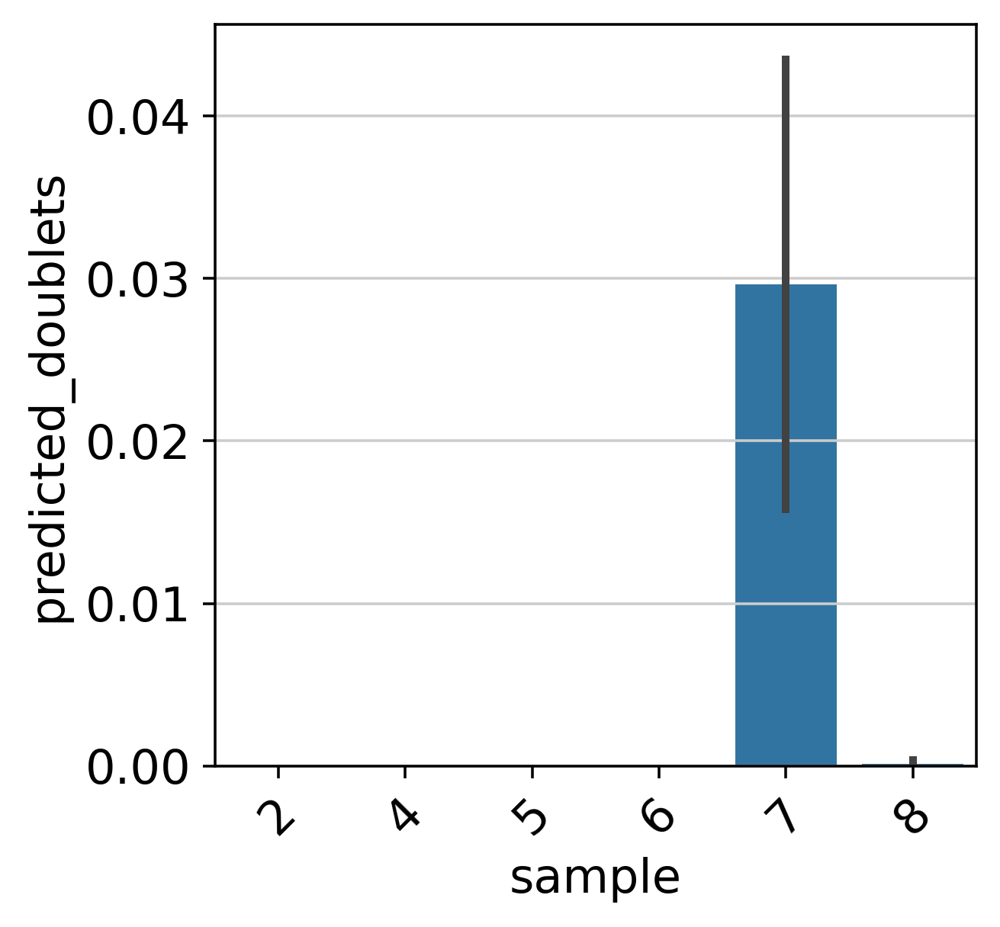

In [27]:
sb.barplot(x=adata.obs['sample'], y=adata.obs['predicted_doublets'])
plt.xticks(rotation = 45)

### Saving raw data

In [28]:
sample_object = adata.copy()
sample_object

AnnData object with n_obs × n_vars = 9177 × 32285
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_CITE', 'nFeature_CITE', 'percent.mt', 'sample', 'doublet_scores', 'predicted_doublets'
    var: 'name'

## Compute QC stats

In [29]:
sample_object.shape

(9177, 32285)

### Labelling Mt and Ribo genes

In [30]:
sample_object.var['mt'] = sample_object.var_names.str.startswith('mt-') 
sample_object.var['ribo'] = sample_object.var_names.str.startswith(("Rps","Rpl"))
sample_object.var

,name,mt,ribo
Xkr4,Xkr4,False,False
Gm1992,Gm1992,False,False
Gm19938,Gm19938,False,False
Gm37381,Gm37381,False,False
Rp1,Rp1,False,False
...,...,...,...
AC124606.1,AC124606.1,False,False
AC133095.2,AC133095.2,False,False
AC133095.1,AC133095.1,False,False
AC234645.1,AC234645.1,False,False


In [31]:
ribo_counts = sample_object.var['ribo'].value_counts()

mt_counts = sample_object.var['mt'].value_counts()

print("Counts of Ribosomal (ribo) Genes:")
print("False:", ribo_counts.get(False, 0))
print("True:", ribo_counts.get(True, 0))
print("\nCounts of Mitochondrial (mt) Genes:")
print("False:", mt_counts.get(False, 0))
print("True:", mt_counts.get(True, 0))

Counts of Ribosomal (ribo) Genes:
False: 32184
True: 101

Counts of Mitochondrial (mt) Genes:
False: 32272
True: 13


### Calculating QC metrics per cell

In [32]:
sc.pp.calculate_qc_metrics(sample_object, qc_vars = ['mt','ribo'], percent_top = None, log1p = False, inplace = True)

In [33]:
sample_object

AnnData object with n_obs × n_vars = 9177 × 32285
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_CITE', 'nFeature_CITE', 'percent.mt', 'sample', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'name', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

### Visualization of qc metrics

Text(0.5, 1.0, 'Mt and Ribo percentages - Before filtering')

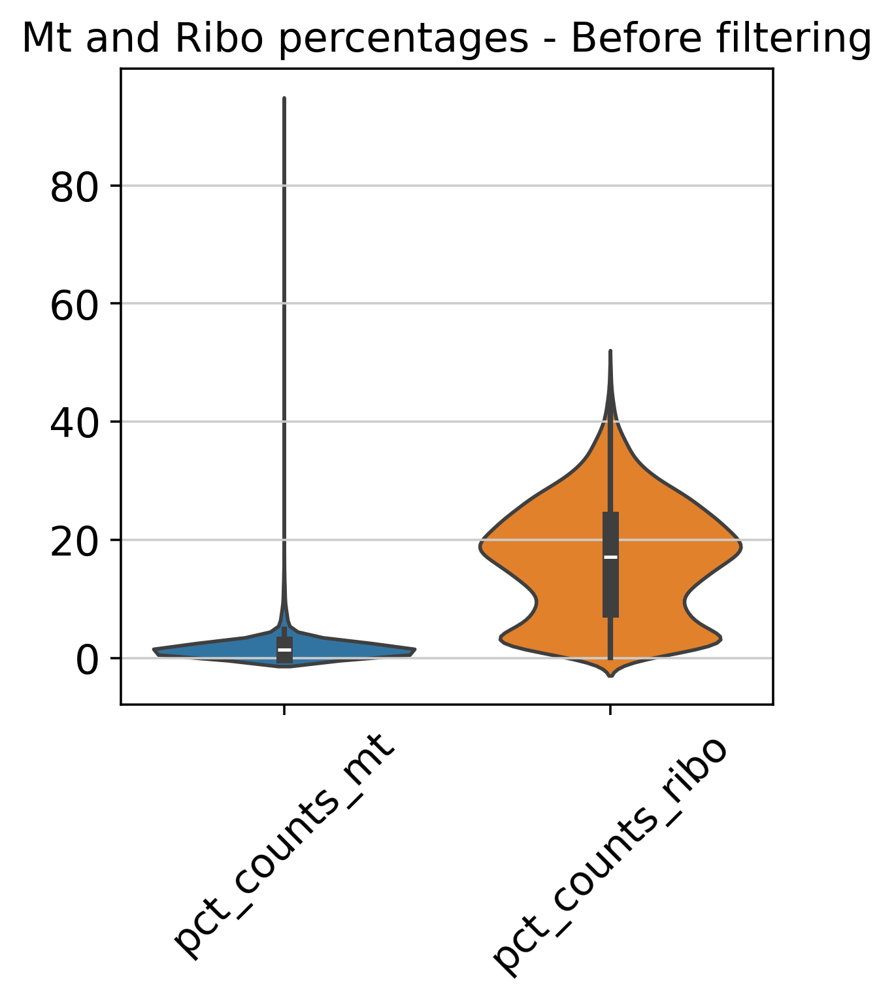

In [34]:
variables = ['pct_counts_mt', 'pct_counts_ribo']

sb.violinplot(data=sample_object.obs[variables])
plt.xticks(rotation=45)
plt.title(f'Mt and Ribo percentages - Before filtering')

##### *Description of violin plots*

**Violin Body**: The central part of the violin plot represents the probability density of the data.

**Box Plot**:
        Median (White line inside the box) Q2 ;
        Quartiles (the edges of the box) Q1,Q3 - Height of box represent Interquartile region (Q1-Q2-Q3) ;
        Outliers (points beyond the whiskers)

**Whiskers**: The whiskers extend from the box to the minimum and maximum values within 1.5 times the IQR from the first and third quartiles

**Outliers**: Individual data points beyond the whiskers

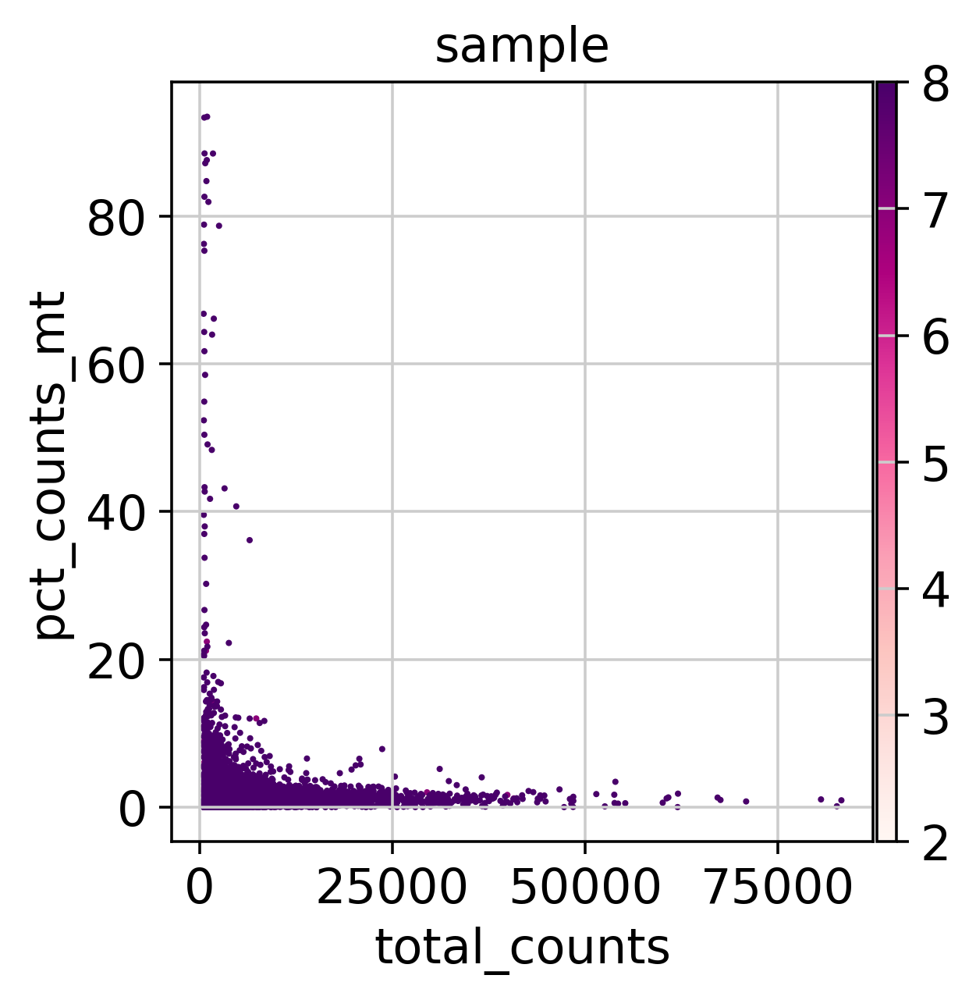

In [35]:
sc.pl.scatter(sample_object, x = 'total_counts', y = 'pct_counts_mt', color = "sample")

In [36]:
sample_object.obs

,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,nCount_CITE,nFeature_CITE,percent.mt,sample,doublet_scores,predicted_doublets,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
AAACCTGAGAACTCGG-1,1926.0,847,442.0,8,87.0,4,0.000000,8,0.121951,False,847,1926.0,0.0,0.000000,35.0,1.817238
AAACCTGAGAGGTTGC-1,1889.0,1161,723.0,8,98.0,4,1.588142,8,0.121951,False,1161,1889.0,30.0,1.588142,253.0,13.393330
AAACCTGAGCTACCTA-1,1273.0,768,572.0,8,68.0,4,0.078555,8,0.147632,False,768,1273.0,1.0,0.078555,53.0,4.163394
AAACCTGAGGAGCGTT-1,1208.0,721,1092.0,8,81.0,4,1.903974,8,0.118280,False,721,1208.0,23.0,1.903974,315.0,26.076159
AAACCTGAGGCACATG-1,2660.0,1369,2746.0,8,128.0,4,1.654135,8,0.118280,False,1369,2660.0,44.0,1.654135,640.0,24.060150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAGCATGAG-1,4772.0,1664,2105.0,8,92.0,4,0.000000,8,0.079070,False,1664,4772.0,0.0,0.000000,204.0,4.274937
TTTGTCACATCTGGTA-1,515.0,410,1813.0,8,147.0,4,4.466019,8,0.058637,False,410,515.0,23.0,4.466019,34.0,6.601942
TTTGTCACATTCTCAT-1,2861.0,1051,1625.0,8,108.0,4,0.104858,8,0.042292,False,1051,2861.0,3.0,0.104858,35.0,1.223348
TTTGTCATCCAAGCCG-1,8934.0,2934,667.0,7,113.0,4,1.399149,7,0.121951,False,2934,8934.0,125.0,1.399149,1745.0,19.532124


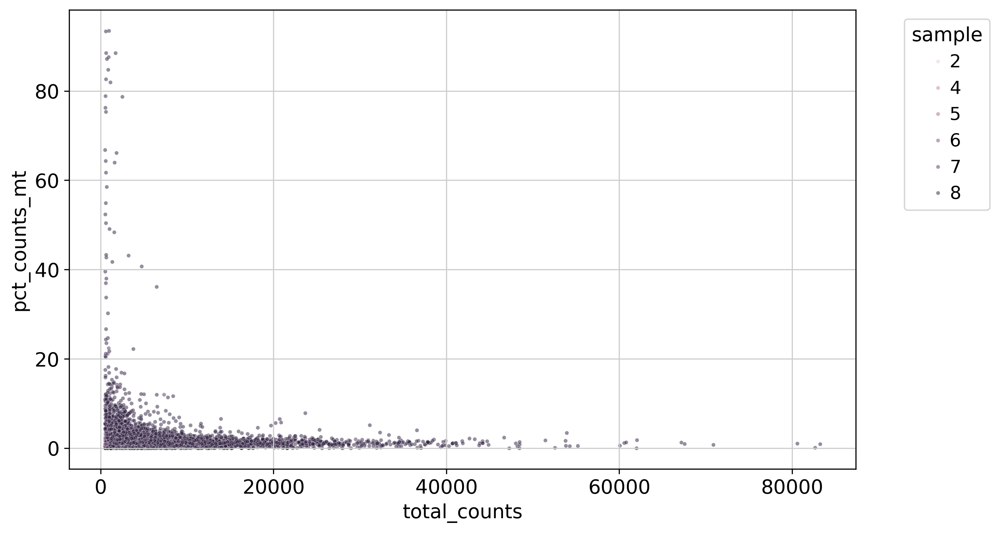

In [37]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='pct_counts_mt' , hue ='sample', alpha = 0.5, s=8,color = 'YeBlu')
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


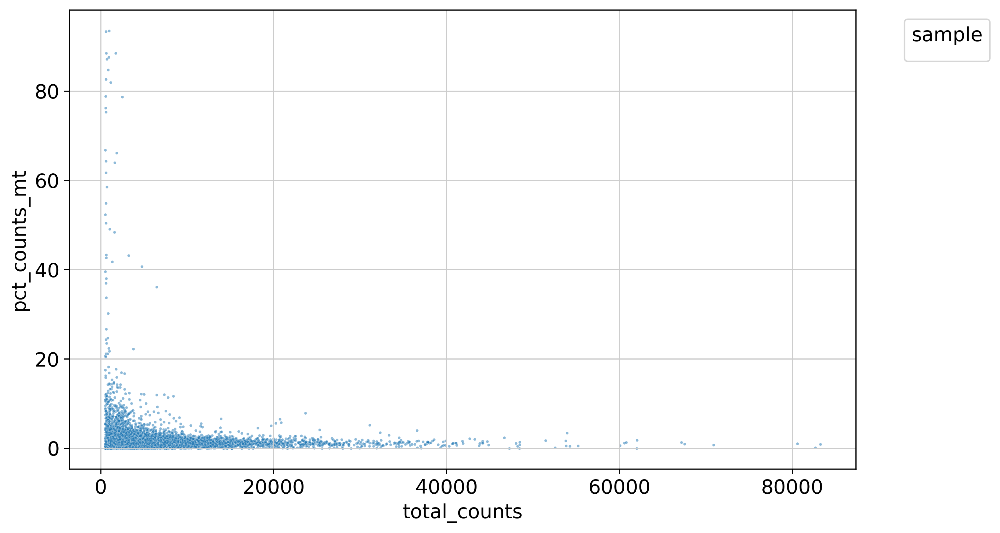

In [38]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='pct_counts_mt' , alpha = 0.5, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

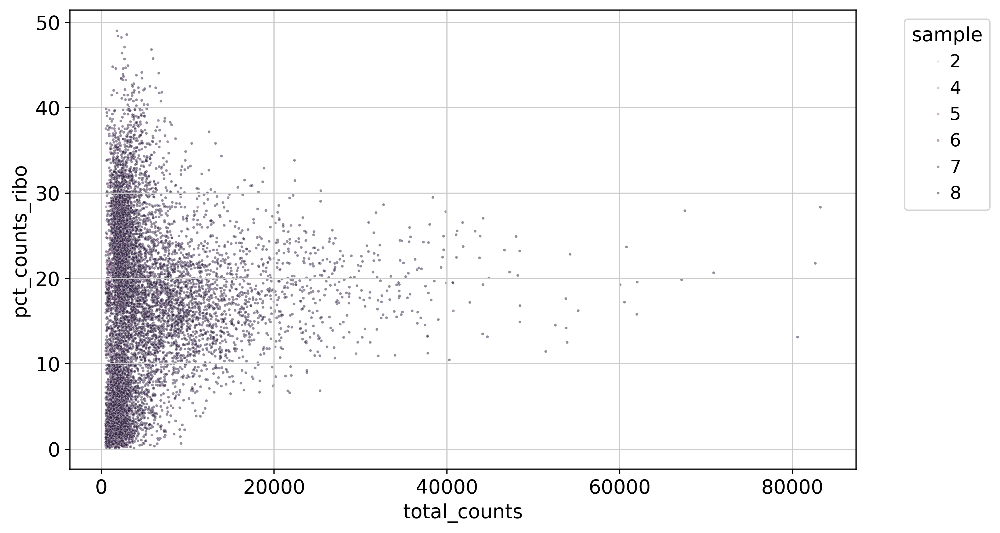

In [39]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='pct_counts_ribo' , hue ='sample', alpha = 0.5, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

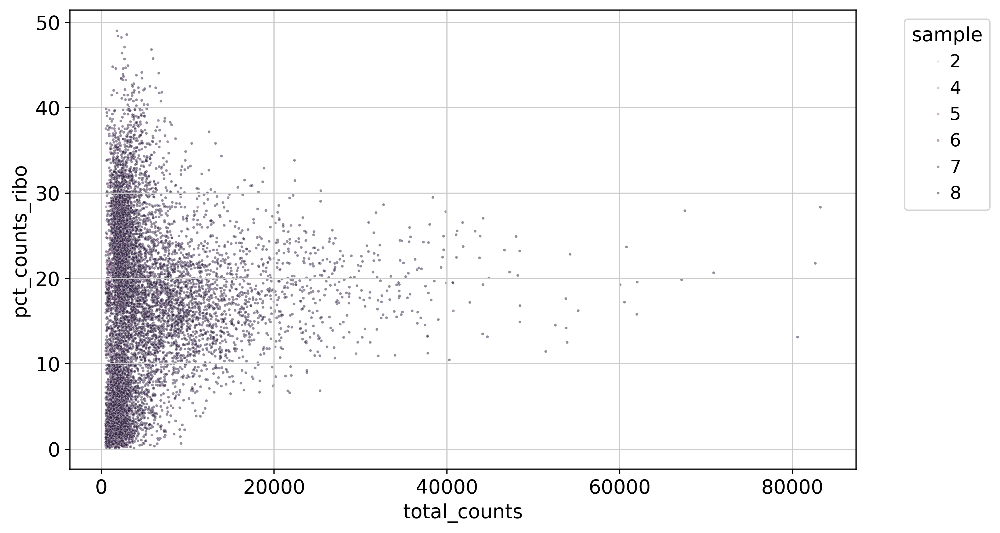

In [40]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='pct_counts_ribo' , hue ='sample', alpha = 0.5, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

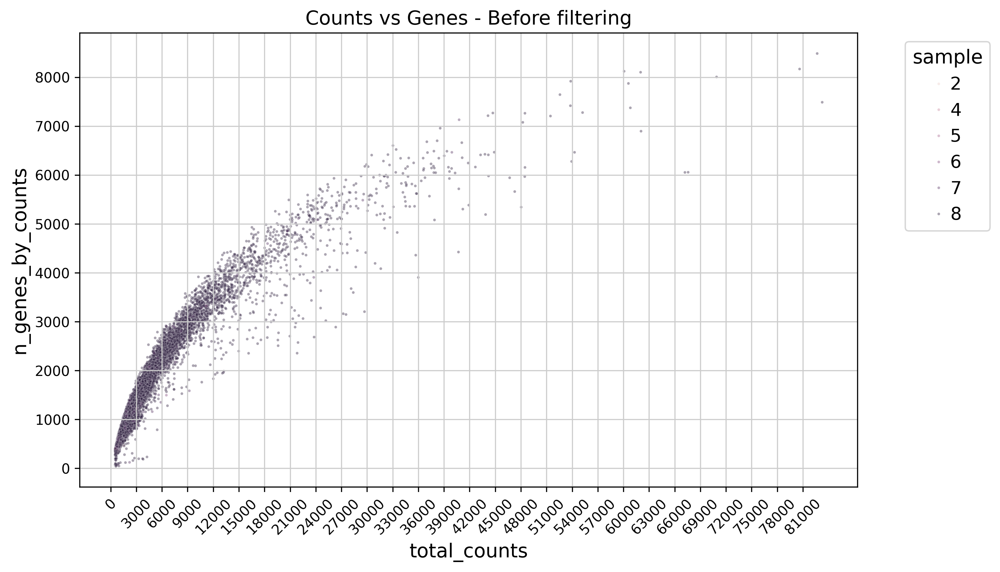

In [41]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='n_genes_by_counts' , hue ='sample', alpha = 0.4, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(range(0, int(max(sample_object.obs['total_counts'])) + 1, 3000),rotation=45, fontsize = 10)
plt.yticks(range(0, int(max(sample_object.obs['n_genes_by_counts'])) + 1, 1000),fontsize = 10)
plt.title(f'Counts vs Genes - Before filtering')
plt.show()

## Sex covariate analysis

### Ensembl annotations

In [42]:
annot = sc.queries.biomart_annotations(
        "mmusculus",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")

In [43]:
annot.head()

,ensembl_gene_id,start_position,end_position,chromosome_name
external_gene_name,,,,
mt-Tf,ENSMUSG00000064336,1,68,MT
mt-Rnr1,ENSMUSG00000064337,70,1024,MT
mt-Tv,ENSMUSG00000064338,1025,1093,MT
mt-Rnr2,ENSMUSG00000064339,1094,2675,MT
mt-Tl1,ENSMUSG00000064340,2676,2750,MT


### Chr Y genes calculation

In [44]:
sample_object.var_names

Index(['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587',
       'Gm37323', 'Mrpl15', 'Lypla1',
       ...
       'Gm16367', 'AC163611.1', 'AC163611.2', 'AC140365.1', 'AC124606.2',
       'AC124606.1', 'AC133095.2', 'AC133095.1', 'AC234645.1', 'AC149090.1'],
      dtype='object', length=32285)

In [45]:
chrY_genes = sample_object.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes

Index(['Gm29089', 'Zfy1', 'Uba1y', 'Gm28588', 'Gm28587', 'Kdm5d', 'Eif2s3y',
       'Gm29650', 'Uty', 'Ddx3y',
       ...
       'Gm28672', 'Gm28670', 'Gm28673', 'Gm28674', 'Gm21996', 'Gm28930',
       'Gm29504', 'Gm20837', 'Gm28300', 'Gm28301'],
      dtype='object', length=709)

In [46]:
sample_object.obs['percent_chrY'] = np.sum(
    sample_object[:, chrY_genes].X, axis = 1) / np.sum(sample_object.X, axis = 1) * 100

### XIST counts

#### Steps followed

1. Select variables having 'xist' in var_names
2. Counts and percentage of XIST 
3. Creating a series to store data
4. Assigning the series back to our data into obs

In [47]:
xist_counts = sample_object.X[:, sample_object.var_names.str.match('Xist')].toarray()
xist_percentage = (np.sum(xist_counts, axis=1) / sample_object.obs['total_counts']) * 100

xist_counts_series = pd.Series(xist_counts.squeeze(), index = sample_object.obs_names, name = "XIST-counts")
xist_percentage_series = pd.Series(xist_percentage, index=sample_object.obs_names, name="percent_XIST")

sample_object.obs["XIST-counts"] = xist_counts_series
sample_object.obs["XIST-percentage"] = xist_percentage_series

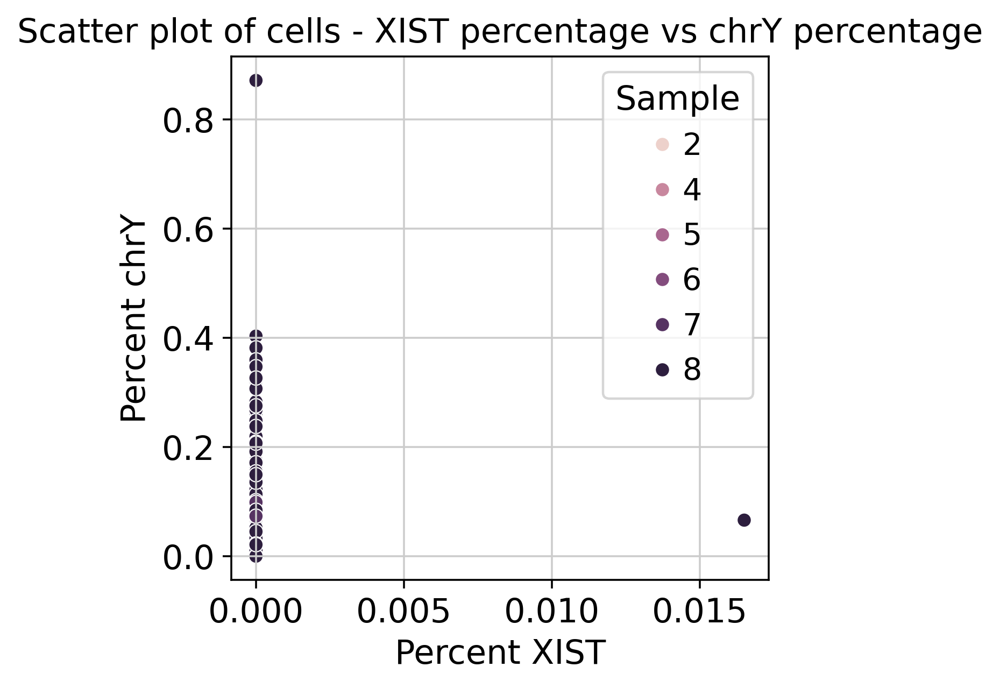

In [48]:
sb.scatterplot(data=sample_object.obs, x="XIST-percentage", y='percent_chrY', hue='sample')
plt.xlabel('Percent XIST')
plt.ylabel('Percent chrY')
plt.title('Scatter plot of cells - XIST percentage vs chrY percentage')
plt.legend(title='Sample')
plt.show()

### Validation of sex covariates

In [51]:
zero_y_counts = len(sample_object.obs[sample_object.obs['percent_chrY'] == 0])
zero_xist_counts = len(sample_object.obs[sample_object.obs['XIST-percentage'] == 0])
both_zero_counts = len(sample_object.obs[(sample_object.obs['percent_chrY'] == 0) & (sample_object.obs['XIST-percentage'] == 0)])

print("Number of observations with 0 Y chromosome counts:", zero_y_counts)
print("Number of observations with 0 XIST counts:", zero_xist_counts)
print("Number of observations with both 0 Y chromosome counts and 0 XIST counts:", both_zero_counts)

Number of observations with 0 Y chromosome counts: 4025
Number of observations with 0 XIST counts: 9176
Number of observations with both 0 Y chromosome counts and 0 XIST counts: 4025


#### Steps followed - Cellular level

1. Create a 'gender_check_cov' variable and classify as male and female based on chrY percentage and XIST percentage
2. Create a 'gender_comparison' variable and classify as true or false in comparision with gender col we have
3. Calculate the counts of True and false
4. Calculate the percentage of True and false counts

In [52]:
sample_object.obs['gender_check_cov'] = np.where(
    (sample_object.obs['percent_chrY'] == 0) & (sample_object.obs['XIST-percentage'] == 0),
    'None',
    np.where(
        sample_object.obs['percent_chrY'] > sample_object.obs['XIST-percentage'],
        'Male',
        'Female'
    )
)

sample_object.obs

,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,nCount_CITE,nFeature_CITE,percent.mt,sample,doublet_scores,predicted_doublets,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,percent_chrY,XIST-counts,XIST-percentage,gender_check_cov
AAACCTGAGAACTCGG-1,1926.0,847,442.0,8,87.0,4,0.000000,8,0.121951,False,847,1926.0,0.0,0.000000,35.0,1.817238,0.000000,0.0,0.0,None
AAACCTGAGAGGTTGC-1,1889.0,1161,723.0,8,98.0,4,1.588142,8,0.121951,False,1161,1889.0,30.0,1.588142,253.0,13.393330,0.052938,0.0,0.0,Male
AAACCTGAGCTACCTA-1,1273.0,768,572.0,8,68.0,4,0.078555,8,0.147632,False,768,1273.0,1.0,0.078555,53.0,4.163394,0.000000,0.0,0.0,None
AAACCTGAGGAGCGTT-1,1208.0,721,1092.0,8,81.0,4,1.903974,8,0.118280,False,721,1208.0,23.0,1.903974,315.0,26.076159,0.000000,0.0,0.0,None
AAACCTGAGGCACATG-1,2660.0,1369,2746.0,8,128.0,4,1.654135,8,0.118280,False,1369,2660.0,44.0,1.654135,640.0,24.060150,0.037594,0.0,0.0,Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAGCATGAG-1,4772.0,1664,2105.0,8,92.0,4,0.000000,8,0.079070,False,1664,4772.0,0.0,0.000000,204.0,4.274937,0.000000,0.0,0.0,None
TTTGTCACATCTGGTA-1,515.0,410,1813.0,8,147.0,4,4.466019,8,0.058637,False,410,515.0,23.0,4.466019,34.0,6.601942,0.000000,0.0,0.0,None
TTTGTCACATTCTCAT-1,2861.0,1051,1625.0,8,108.0,4,0.104858,8,0.042292,False,1051,2861.0,3.0,0.104858,35.0,1.223348,0.000000,0.0,0.0,None
TTTGTCATCCAAGCCG-1,8934.0,2934,667.0,7,113.0,4,1.399149,7,0.121951,False,2934,8934.0,125.0,1.399149,1745.0,19.532124,0.022386,0.0,0.0,Male


#### Steps followed - sample level

1. Group by sample and calculate the gender for each sample
2. Classify samples based on the counts of gender_check_cov
3. Calculate gender comparison at the sample level by considering the highest number of male, female and none classification of cells in the sample
4. Create DataFrame for classification
5. Display the results

In [53]:
sample_gender_list = []

for sample in sample_object.obs['sample'].unique():
    sample_data = sample_object.obs[sample_object.obs['sample'] == sample]
    gender_counts = sample_data['gender_check_cov'].value_counts()
    
    if 'Male' in gender_counts.index and 'Female' in gender_counts.index and 'None' in gender_counts.index:
        if gender_counts['None'] > gender_counts['Male'] and gender_counts['None'] > gender_counts['Female']:
            sample_gender = 'None'
        elif gender_counts['Male'] > gender_counts['Female']:
            sample_gender = 'Male'
        else:
            sample_gender = 'Female'
    elif 'Male' in gender_counts.index and 'Female' in gender_counts.index:
        if gender_counts['Male'] > gender_counts['Female']:
            sample_gender = 'Male'
        else:
            sample_gender = 'Female'
    elif 'Male' in gender_counts.index:
        sample_gender = 'Male'
    elif 'Female' in gender_counts.index:
        sample_gender = 'Female'
    else:
        sample_gender = 'None'
    
    sample_gender_list.append((sample, sample_gender))

sample_gender_df = pd.DataFrame(sample_gender_list, columns=['sample', 'gender'])

print(sample_gender_df)

   sample gender
0       8   Male
1       7   Male
2       6   Male
3       5   Male
4       4   None
5       2   None


([0, 1, 2, 3, 4, 5],
 [Text(0, 0, '2'),
  Text(1, 0, '4'),
  Text(2, 0, '5'),
  Text(3, 0, '6'),
  Text(4, 0, '7'),
  Text(5, 0, '8')])

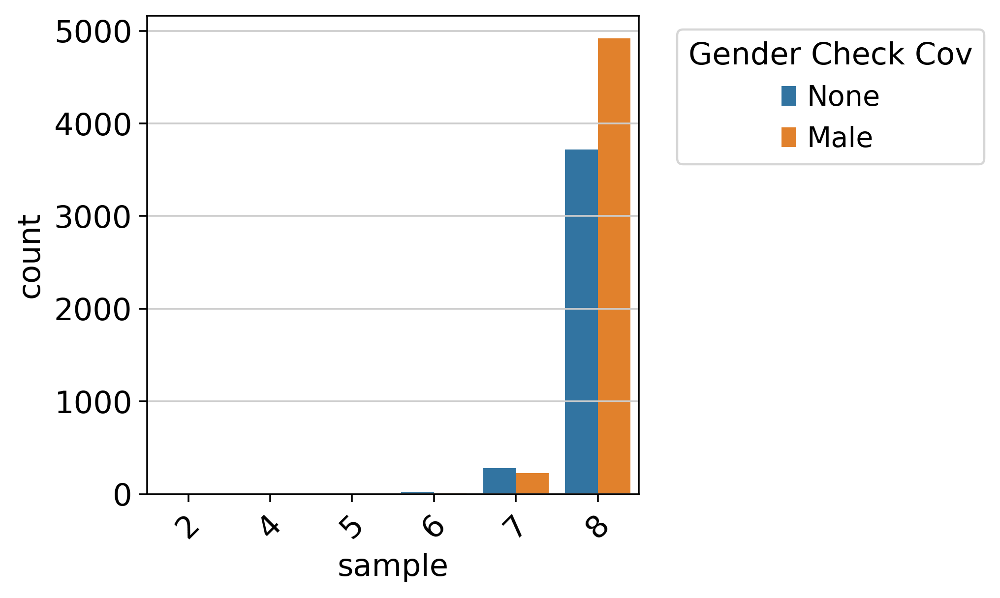

In [58]:
sb.countplot(data=sample_object.obs, x ='sample',hue='gender_check_cov')
plt.legend(title='Gender Check Cov', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation = 45)

## Calculate cell cycle scores

### Downloading the list of cell cycle genes

In [64]:
!if [ ! -f ../data/regev_lab_cell_cycle_genes.txt ]; then curl -o /home/cartalop/Downloads/regev_lab_cell_cycle_genes.txt https://raw.githubusercontent.com/theislab/scanpy_usage/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt; fi

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   556  100   556    0     0   2465      0 --:--:-- --:--:-- --:--:--  2460


### Marking cell cycle genes

#### Steps followed

1. Loading genes and captilizing 
2. Printing the length of cell cycle genes list
3. Split genes into 2 lists (#First 43 genes,#Gene 43 to end)
4. Filtering cell cycle genes only if present in processed_gene_names
5. Print the list of cell cycle genes observed in our data

In [65]:
cell_cycle_genes = [x.strip() for x in open('/home/cartalop/Downloads/regev_lab_cell_cycle_genes.txt')]
cell_cycle_genes = [gene.capitalize() for gene in cell_cycle_genes]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in sample_object.var_names]
print(len(cell_cycle_genes))

97
94


In [66]:
cell_cycle_genes

['Mcm5',
 'Pcna',
 'Tyms',
 'Fen1',
 'Mcm2',
 'Mcm4',
 'Rrm1',
 'Ung',
 'Gins2',
 'Mcm6',
 'Cdca7',
 'Dtl',
 'Prim1',
 'Uhrf1',
 'Hells',
 'Rfc2',
 'Rpa2',
 'Nasp',
 'Rad51ap1',
 'Gmnn',
 'Wdr76',
 'Slbp',
 'Ccne2',
 'Ubr7',
 'Pold3',
 'Msh2',
 'Atad2',
 'Rad51',
 'Rrm2',
 'Cdc45',
 'Cdc6',
 'Exo1',
 'Tipin',
 'Dscc1',
 'Blm',
 'Casp8ap2',
 'Usp1',
 'Clspn',
 'Pola1',
 'Chaf1b',
 'Brip1',
 'E2f8',
 'Hmgb2',
 'Cdk1',
 'Nusap1',
 'Ube2c',
 'Birc5',
 'Tpx2',
 'Top2a',
 'Ndc80',
 'Cks2',
 'Nuf2',
 'Cks1b',
 'Mki67',
 'Tmpo',
 'Cenpf',
 'Tacc3',
 'Smc4',
 'Ccnb2',
 'Ckap2l',
 'Ckap2',
 'Aurkb',
 'Bub1',
 'Kif11',
 'Anp32e',
 'Tubb4b',
 'Gtse1',
 'Kif20b',
 'Hjurp',
 'Cdca3',
 'Cdc20',
 'Ttk',
 'Cdc25c',
 'Kif2c',
 'Rangap1',
 'Ncapd2',
 'Dlgap5',
 'Cdca2',
 'Cdca8',
 'Ect2',
 'Kif23',
 'Hmmr',
 'Aurka',
 'Psrc1',
 'Anln',
 'Lbr',
 'Ckap5',
 'Cenpe',
 'Ctcf',
 'Nek2',
 'G2e3',
 'Gas2l3',
 'Cbx5',
 'Cenpa']

### Creating basic anndata and normalization for cell cycle score calculation

In [67]:
adata_log = anndata.AnnData(X = sample_object.X,  var = sample_object.var, obs = sample_object.obs)
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)

normalizing counts per cell. The following highly-expressed genes are not considered during normalization factor computation:
['Camk1d', 'Slpi', 'S100a8', 'S100a9', 'Cxcl2', 'Spp1', 'Cdk8', 'Igkv1-135', 'Igkv14-126', 'Igkv11-125', 'Igkv9-124', 'Igkv9-120', 'Igkv1-117', 'Igkv1-110', 'Igkv2-109', 'Igkv12-98', 'Igkv10-96', 'Igkv10-94', 'Igkv19-93', 'Igkv4-91', 'Igkv12-89', 'Igkv4-79', 'Igkv4-70', 'Igkv6-17', 'Igkv6-15', 'Igkc', 'Clec4e', 'Saa3', 'Hbb-bt', 'Hbb-bs', 'Mt1', 'Lars2', 'Hba-a1', 'Hba-a2', 'Ccl1', 'Ccl5', 'Ccl4', 'Wfdc17', 'Gphn', 'Hsp90aa1', 'Ighg2b', 'Ighg1', 'Ighg3', 'Ighm', 'Ighv4-1', 'Hexb', 'Il31ra', 'Bmpr1a', 'Iglc1', 'Iglv1', 'Iglv2', 'Retnlg', 'Cmss1', 'Hspa1b', 'Hspa1a', 'Gm42418', 'AY036118', 'Malat1', 'Fth1', 'Tmsb4x', 'Gm15247', 'mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3', 'mt-Nd4l', 'mt-Nd4', 'mt-Cytb']
    finished (0:00:00)


### Cell cycle score calculation

In [68]:
sc.tl.score_genes_cell_cycle(adata_log, s_genes = s_genes, g2m_genes = g2m_genes)

sample_object.obs['S_score'] = adata_log.obs['S_score']
sample_object.obs['G2M_score'] = adata_log.obs['G2M_score']
sample_object.obs['phase'] = adata_log.obs['phase']

sample_object

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    343 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    427 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


AnnData object with n_obs × n_vars = 9177 × 32285
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_CITE', 'nFeature_CITE', 'percent.mt', 'sample', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'name', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [69]:
cell_cycle_counts = sample_object.obs['phase'].value_counts()

cell_cycle_counts

phase
G1     6601
S      1633
G2M     943
Name: count, dtype: int64

<Axes: xlabel='phase', ylabel='count'>

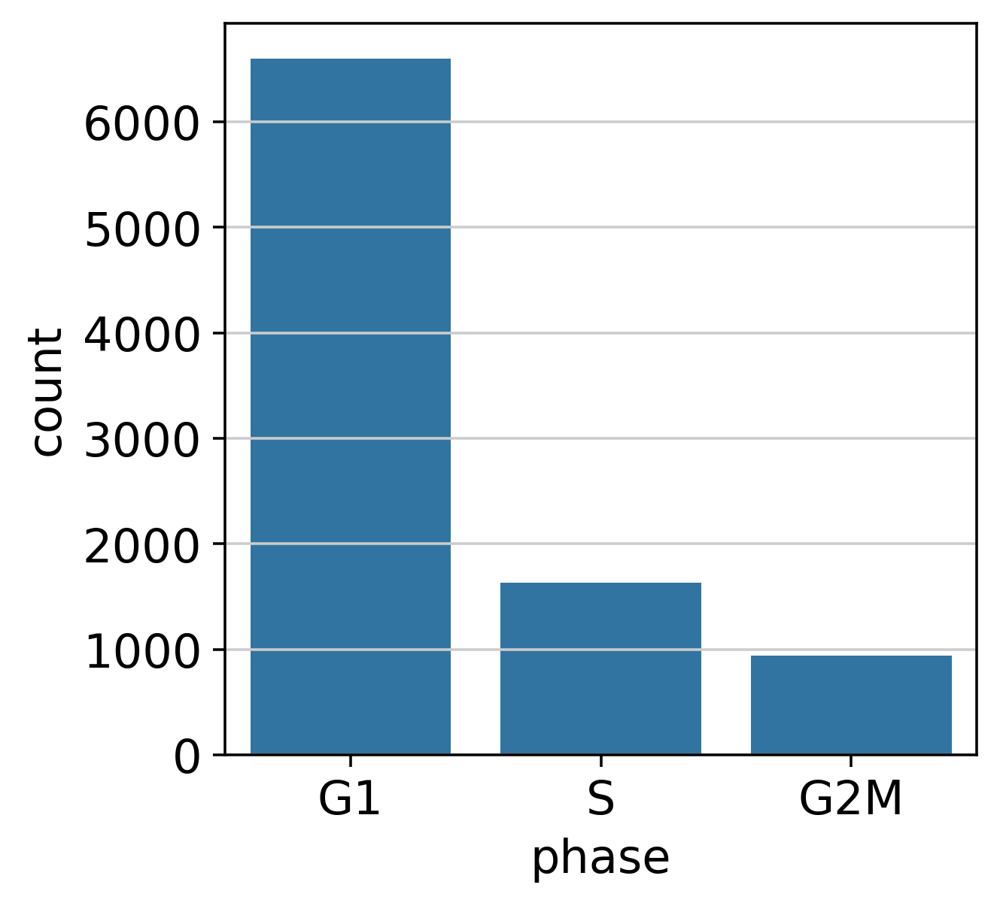

In [70]:
sb.countplot(data=sample_object.obs, x='phase')

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, '2'),
  Text(1, 0, '4'),
  Text(2, 0, '5'),
  Text(3, 0, '6'),
  Text(4, 0, '7'),
  Text(5, 0, '8')])

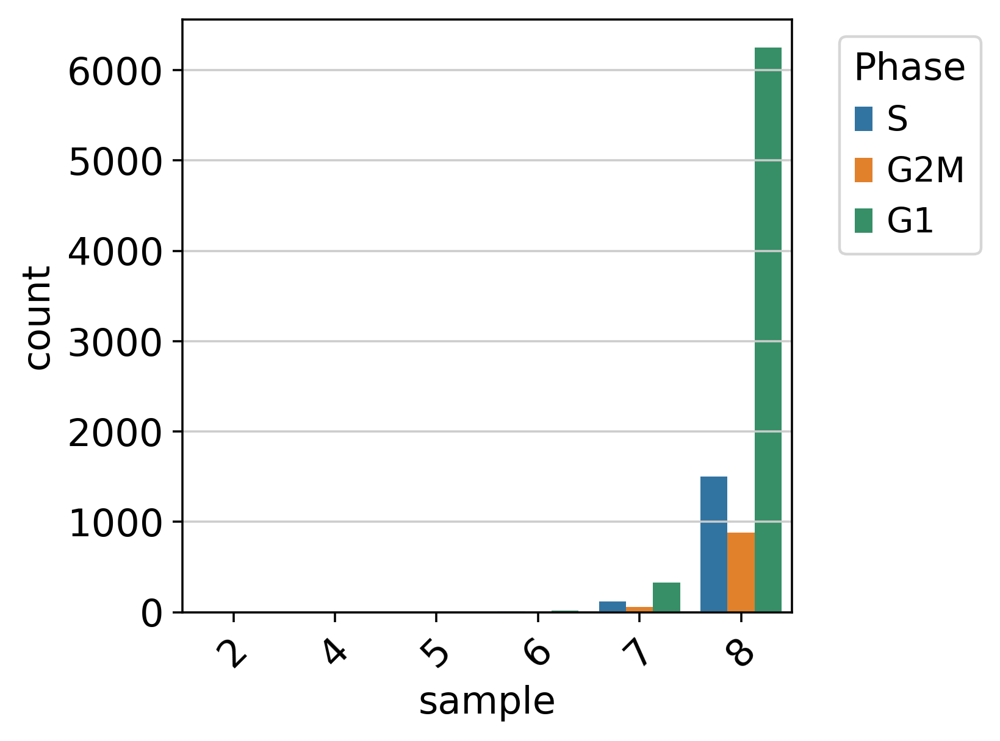

In [71]:
sb.countplot(data=sample_object.obs, x='sample', hue= 'phase')
plt.legend(title = 'Phase',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)

## Data visualization

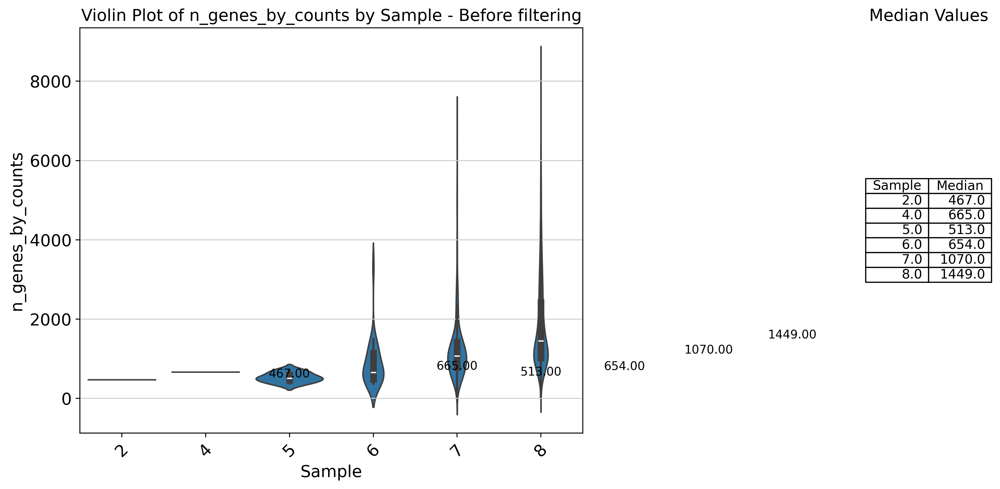

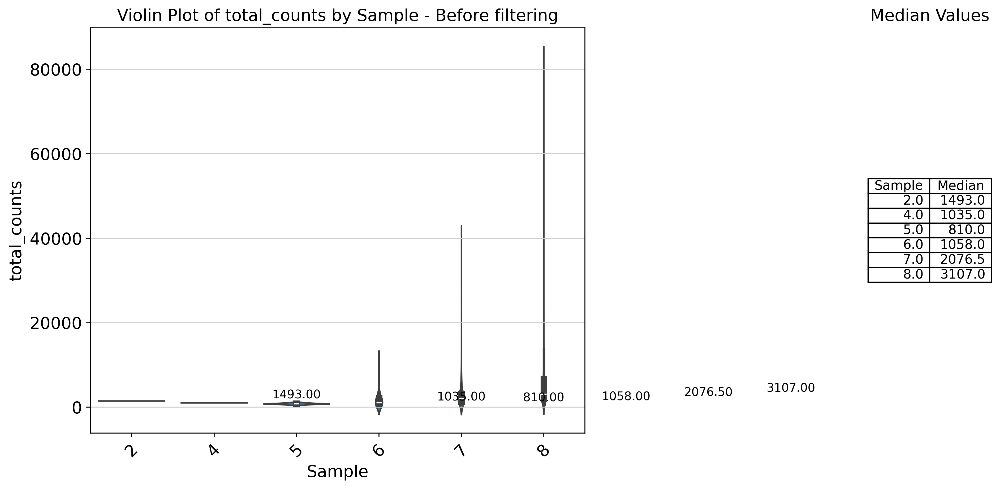

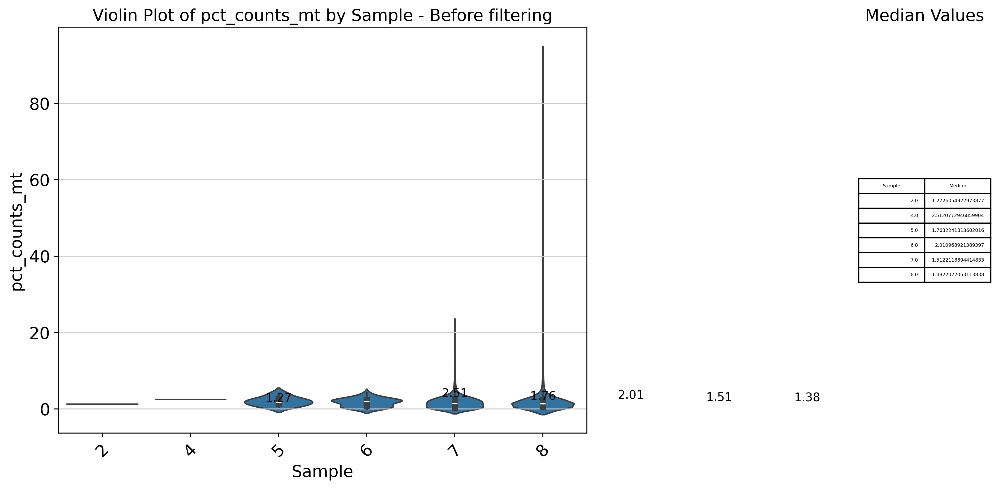

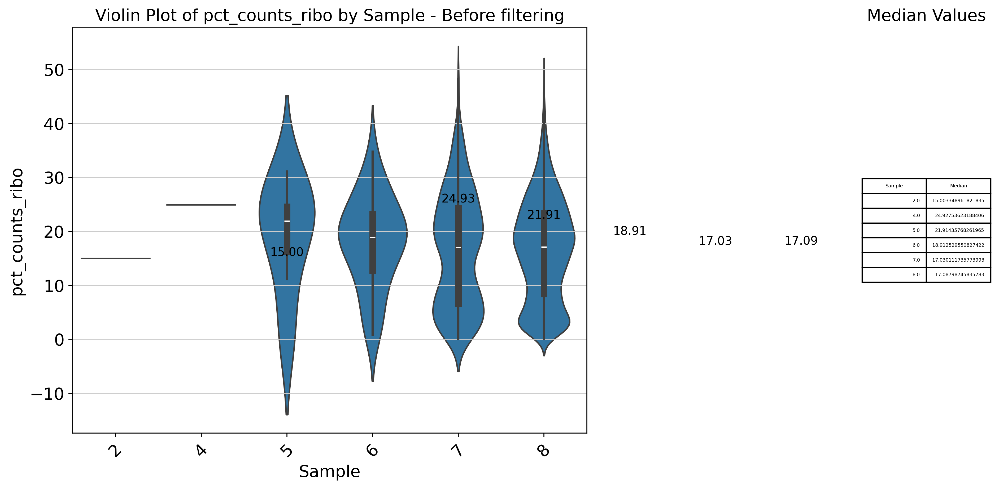

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


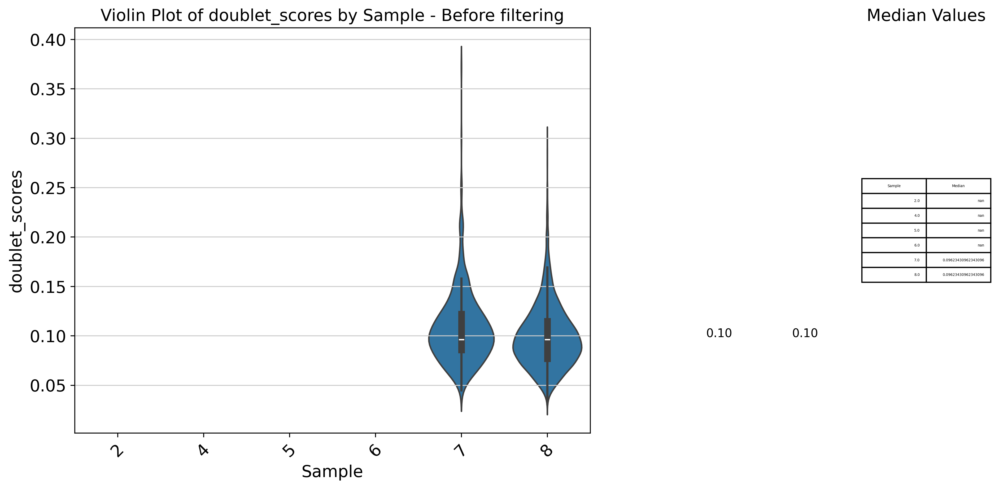

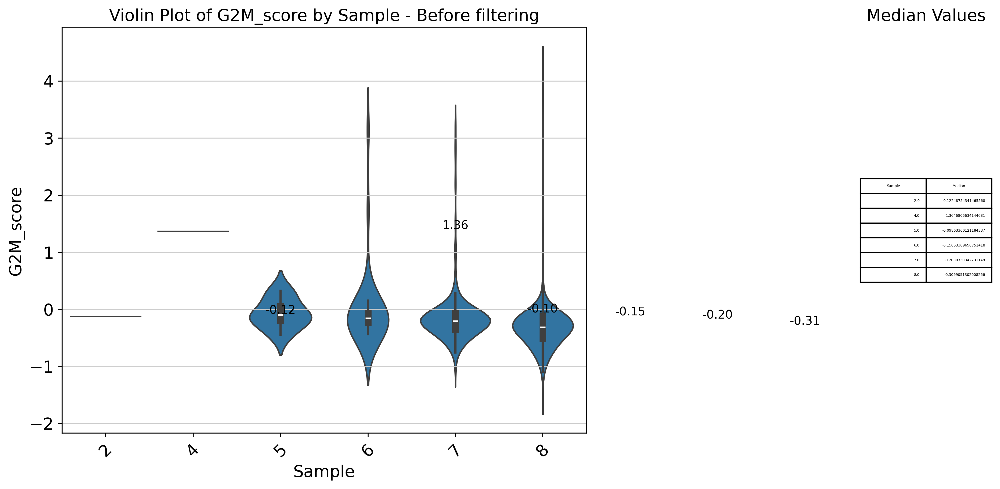

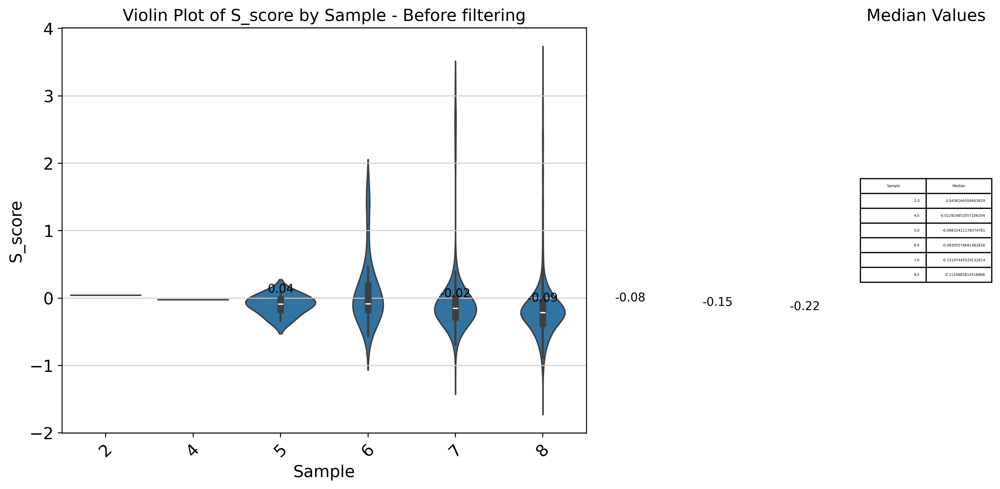

In [72]:
variables = 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'doublet_scores', 'G2M_score', 'S_score'

for var in variables:

    fig, ax = plt.subplots(figsize=(12, 6), ncols=2, gridspec_kw={'width_ratios': [4, 1]})

    sb.violinplot(data=sample_object.obs, x='sample', y=var, ax=ax[0])
   
    medians = sample_object.obs.groupby('sample')[var].median()

    for sample, median in medians.items():
        ax[0].text(sample, median, f'{median:.2f}', ha='center', va='bottom', color='black', fontsize=10)
    
    ax[0].set_title(f'Violin Plot of {var} by Sample - Before filtering')
    ax[0].set_xlabel('Sample')
    ax[0].set_ylabel(var)
    ax[0].tick_params(axis='x', rotation=45)

    median_df = pd.DataFrame({'Sample': medians.index, 'Median': medians.values})

    ax[1].axis('off')
    ax[1].table(cellText=median_df.values, colLabels=median_df.columns, loc='center')
    ax[1].set_title('Median Values')
    
    plt.tight_layout()
    plt.show()


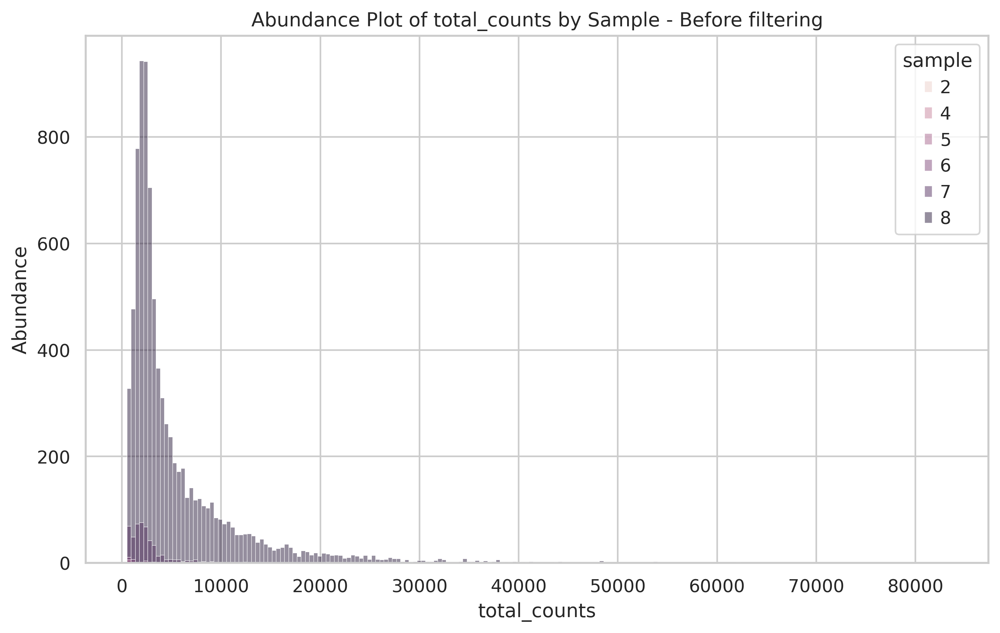

In [73]:
sb.set(style = "whitegrid")
covariate_to_visualize = 'total_counts'

plt.figure(figsize = (10, 6))
sb.histplot(data = sample_object.obs, x = covariate_to_visualize, hue = 'sample', stat = 'count', common_norm = False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.xticks(range(0, int(max(sample_object.obs['total_counts'])) + 1, 10000))
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - Before filtering')
plt.show()

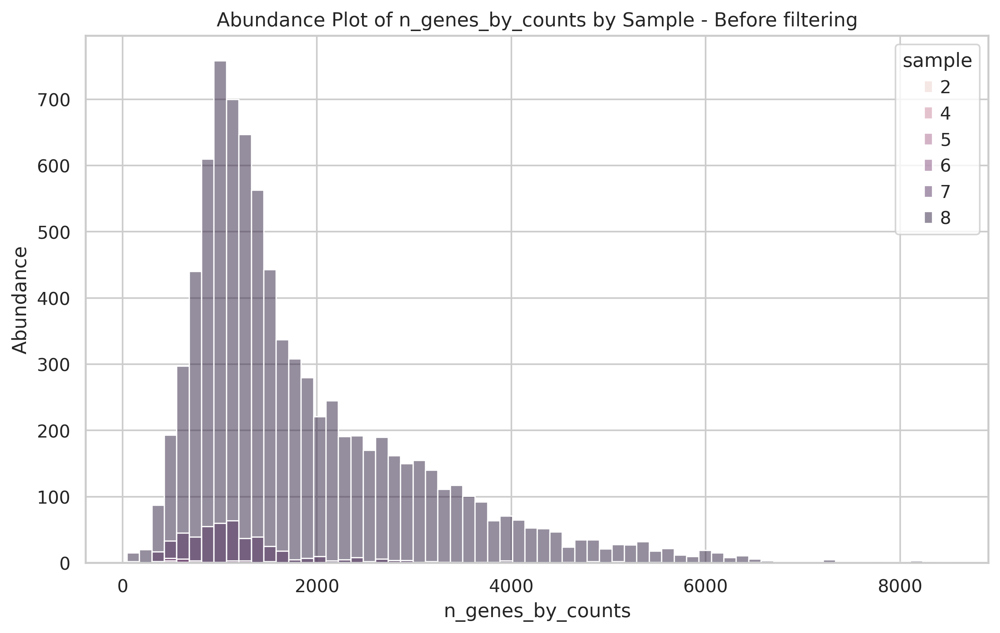

In [74]:
sb.set(style = "whitegrid")
covariate_to_visualize = 'n_genes_by_counts'

plt.figure(figsize = (10, 6))
sb.histplot(data = sample_object.obs, x = covariate_to_visualize, hue = 'sample', stat = 'count', common_norm = False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - Before filtering')
plt.show()

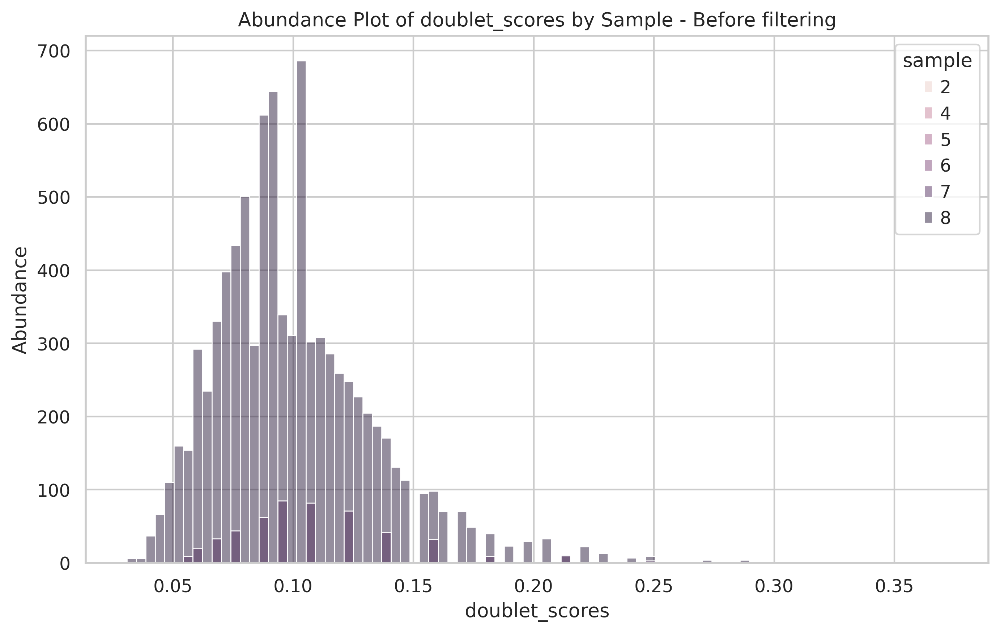

In [75]:
sb.set(style="whitegrid")
covariate_to_visualize = 'doublet_scores'

plt.figure(figsize=(10, 6))
sb.histplot(data=sample_object.obs, x=covariate_to_visualize, hue='sample', stat='count', common_norm=False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - Before filtering')
plt.show()

In [76]:
sample_object.shape

(9177, 32285)

### Filtering based on QC metrics

In [92]:
filtered_object = sample_object[sample_object.obs['n_genes_by_counts'] > 200]
filtered_object = filtered_object[filtered_object.obs['n_genes_by_counts'] < 6000]

filtered_object = filtered_object[filtered_object.obs['total_counts'] > 200]
filtered_object = filtered_object[filtered_object.obs['total_counts'] < 20000]

filtered_object = filtered_object[filtered_object.obs['pct_counts_mt'] < 60]
filtered_object = filtered_object[filtered_object.obs['pct_counts_ribo'] < 20]

filtered_object = filtered_object[filtered_object.obs['doublet_scores'] < 0.35]

filtered_object

View of AnnData object with n_obs × n_vars = 5476 × 32285
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_CITE', 'nFeature_CITE', 'percent.mt', 'sample', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'name', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

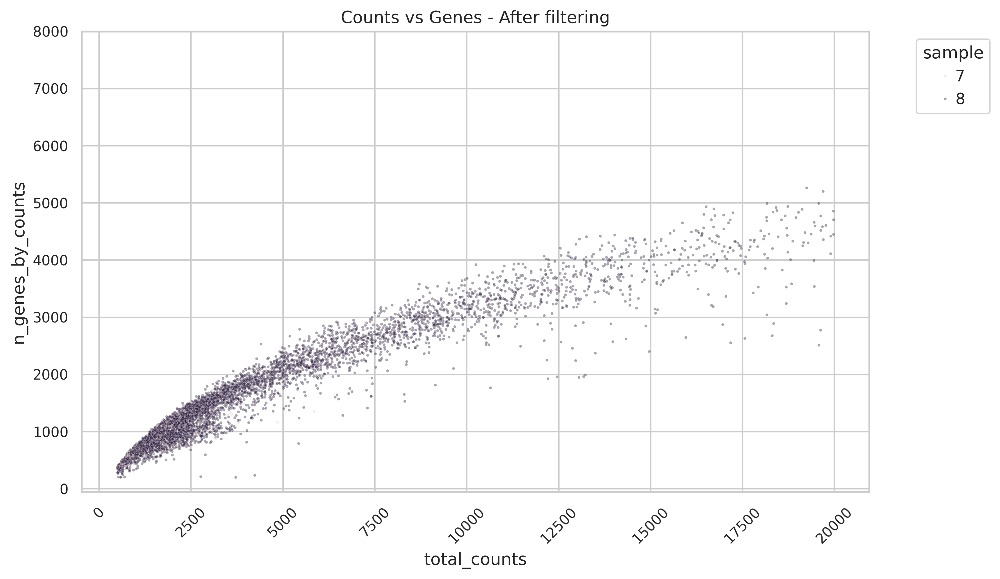

In [93]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=filtered_object.obs, x='total_counts', y='n_genes_by_counts' , hue ='sample', alpha = 0.4, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, fontsize = 10)
plt.yticks(fontsize = 10)
plt.yticks(range(0, int(max(sample_object.obs['n_genes_by_counts'])) + 1, 1000),fontsize = 10)
plt.title(f'Counts vs Genes - After filtering')
plt.show()

Text(0.5, 1.0, 'Mt and Ribo percentages - After filtering')

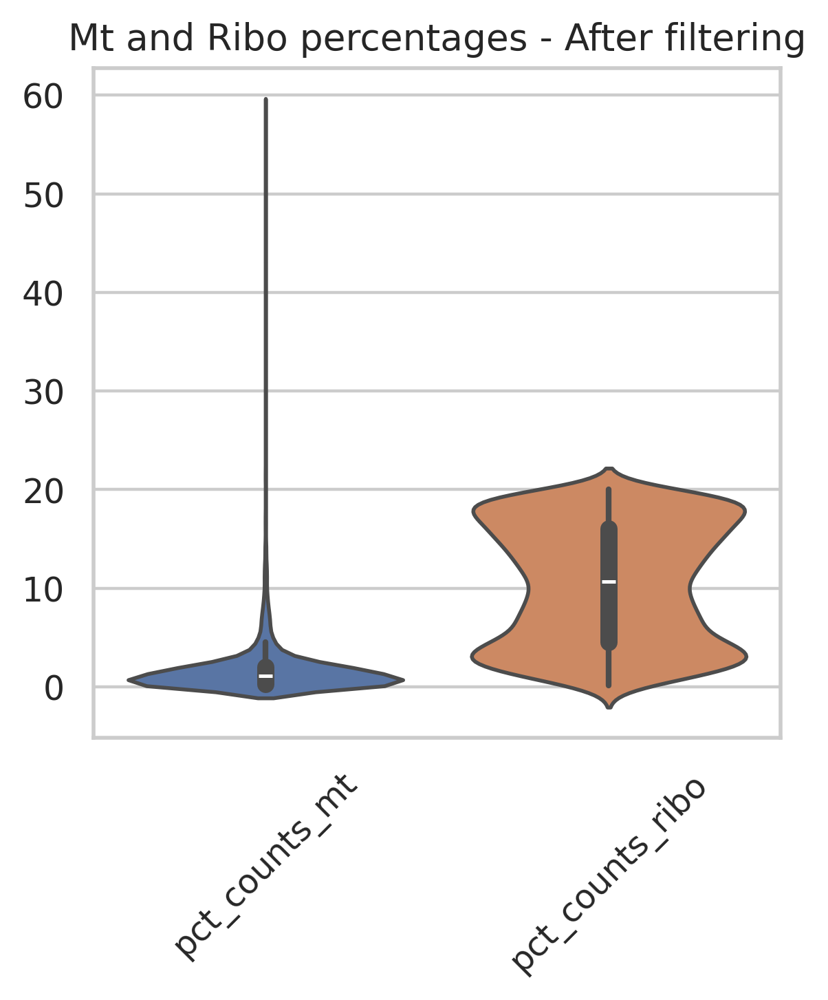

In [94]:
variables = ['pct_counts_mt', 'pct_counts_ribo']

sb.violinplot(data=filtered_object.obs[variables])
plt.xticks(rotation=45)
plt.title(f'Mt and Ribo percentages - After filtering')

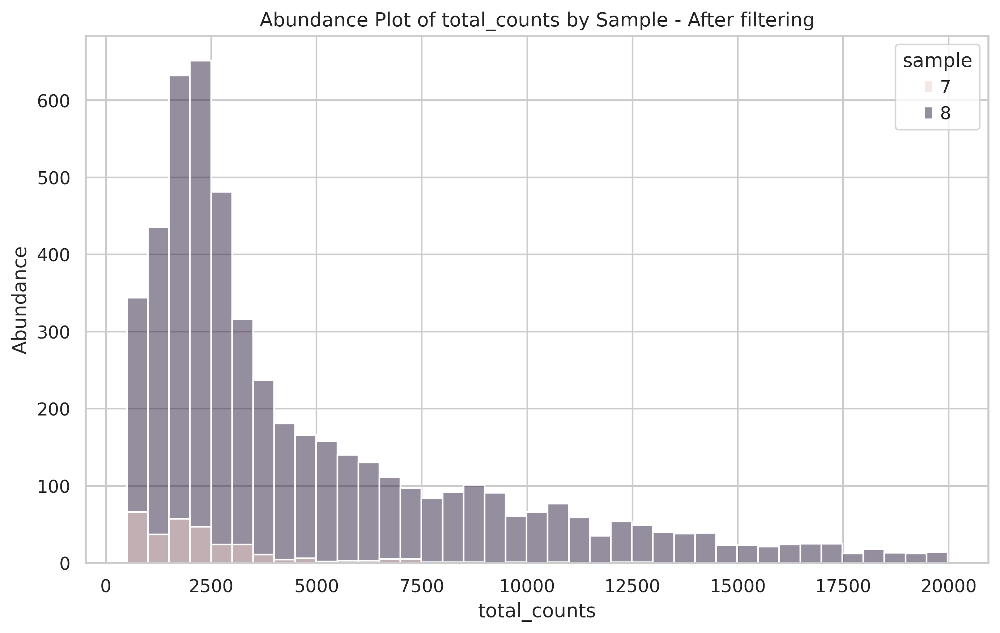

In [95]:
sb.set(style = "whitegrid")
covariate_to_visualize = 'total_counts'

plt.figure(figsize = (10, 6))
sb.histplot(data = filtered_object.obs, x = covariate_to_visualize, hue = 'sample', stat = 'count', common_norm = False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - After filtering')
plt.show()

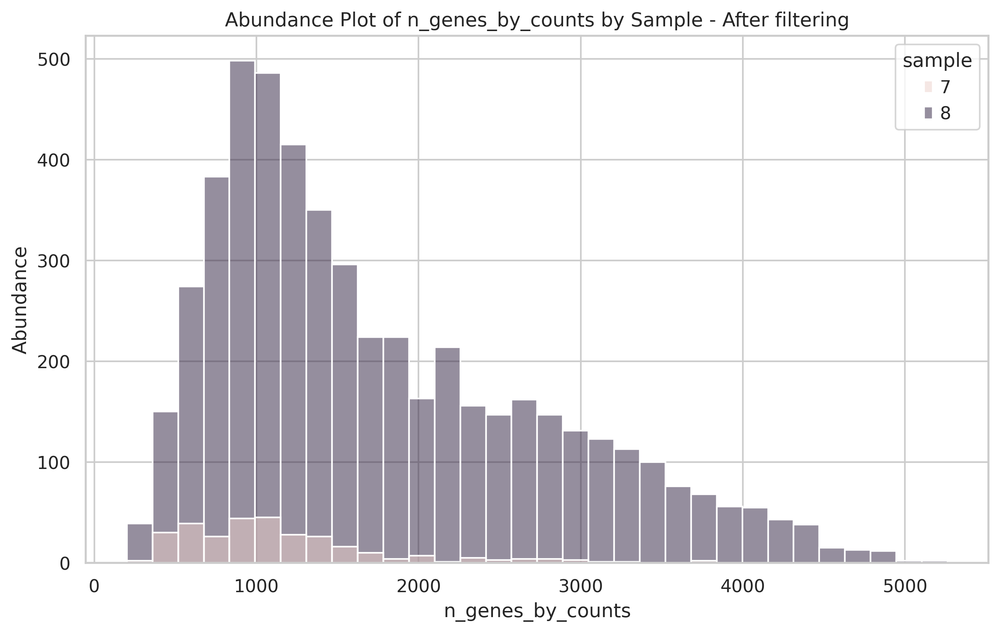

In [96]:
sb.set(style = "whitegrid")
covariate_to_visualize = 'n_genes_by_counts'

plt.figure(figsize = (10, 6))
sb.histplot(data = filtered_object.obs, x = covariate_to_visualize, hue = 'sample', stat = 'count', common_norm = False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - After filtering')
plt.show()

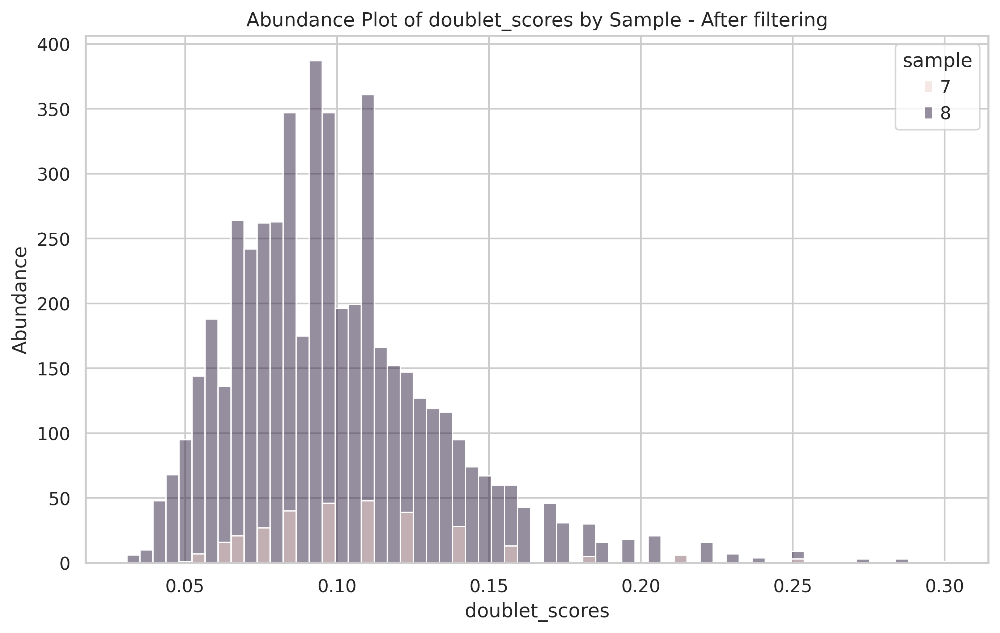

In [97]:
sb.set(style="whitegrid")
covariate_to_visualize = 'doublet_scores'

plt.figure(figsize=(10, 6))
sb.histplot(data=filtered_object.obs, x=covariate_to_visualize, hue='sample', stat='count', common_norm=False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - After filtering')
plt.show()

/tmp/ipykernel_87779/402557926.py:25: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


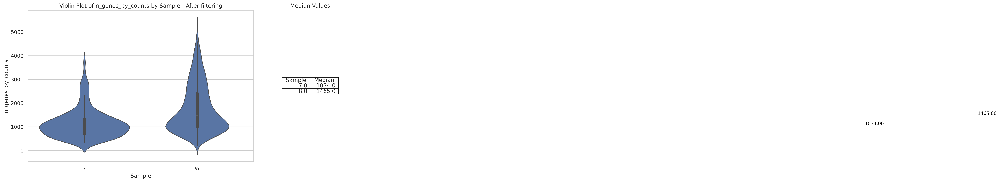

/tmp/ipykernel_87779/402557926.py:25: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


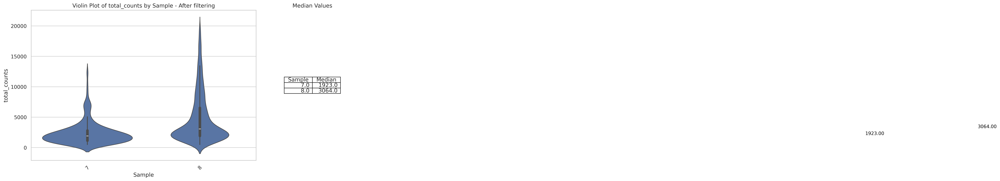

/tmp/ipykernel_87779/402557926.py:25: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


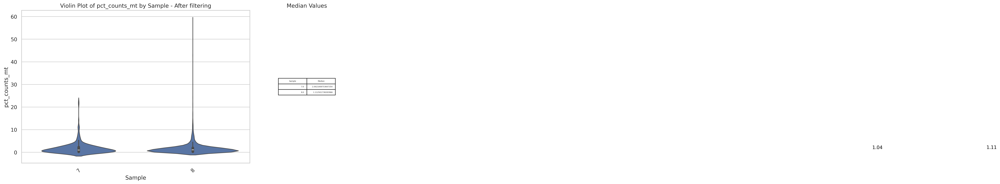

/tmp/ipykernel_87779/402557926.py:25: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


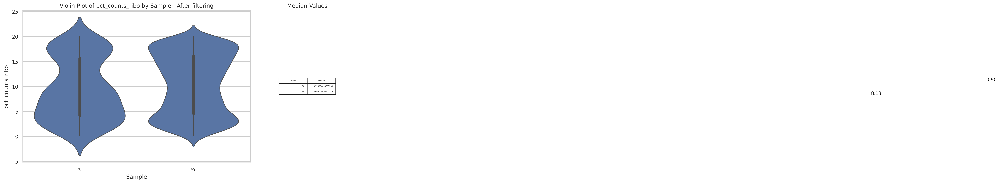

/tmp/ipykernel_87779/402557926.py:25: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


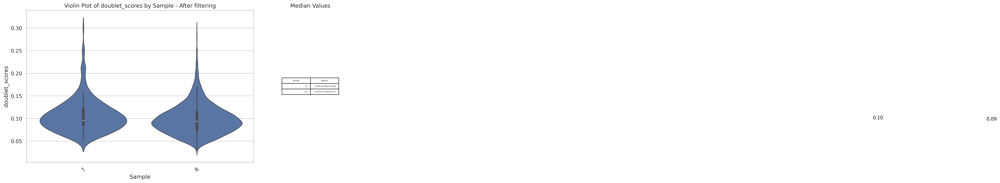

/tmp/ipykernel_87779/402557926.py:25: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


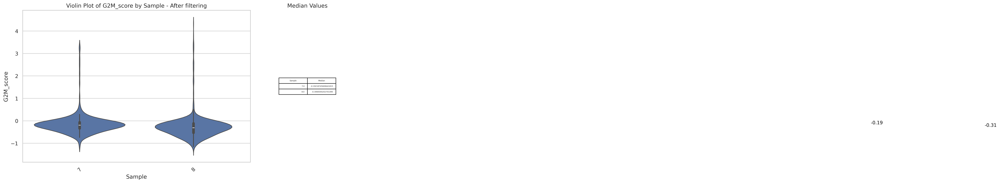

/tmp/ipykernel_87779/402557926.py:25: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


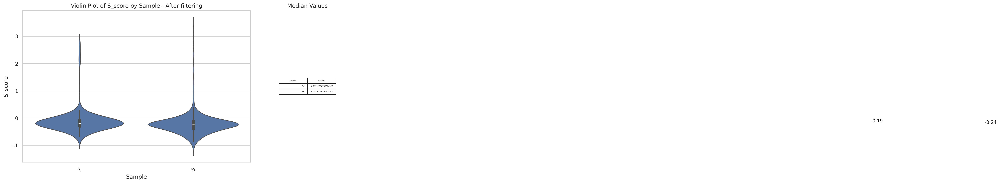

In [98]:
variables = 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'doublet_scores', 'G2M_score', 'S_score' 

for var in variables:

    fig, ax = plt.subplots(figsize=(12, 6), ncols=2, gridspec_kw={'width_ratios': [4, 1]})

    sb.violinplot(data=filtered_object.obs, x='sample', y=var, ax=ax[0])
   
    medians = filtered_object.obs.groupby('sample')[var].median()

    for sample, median in medians.items():
        ax[0].text(sample, median, f'{median:.2f}', ha='center', va='bottom', color='black', fontsize=10)
    
    ax[0].set_title(f'Violin Plot of {var} by Sample - After filtering')
    ax[0].set_xlabel('Sample')
    ax[0].set_ylabel(var)
    ax[0].tick_params(axis='x', rotation=45)

    median_df = pd.DataFrame({'Sample': medians.index, 'Median': medians.values})

    ax[1].axis('off')
    ax[1].table(cellText=median_df.values, colLabels=median_df.columns, loc='center')
    ax[1].set_title('Median Values')
    
    plt.tight_layout()
    plt.show()

## Data normalization

#### Steps followed

1. Creating a copy 
2. Saving counts as a layer without normalization
3. Normalizing cells and squaring them to root to stabilize

In [99]:
filtered_object.raw = filtered_object.copy()

filtered_object.layers['counts'] = filtered_object.X.copy()

filtered_object.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(filtered_object, inplace = False)["X"]
)

filtered_object

normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 5476 × 32285
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_CITE', 'nFeature_CITE', 'percent.mt', 'sample', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'name', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts', 'sqrt_norm'

## Data Export

In [100]:
filtered_object.obs.dtypes

nCount_RNA            float64
nFeature_RNA            int32
nCount_HTO            float64
nFeature_HTO            int32
nCount_CITE           float64
nFeature_CITE           int32
percent.mt            float64
sample                  int32
doublet_scores        float64
predicted_doublets     object
n_genes_by_counts       int64
total_counts          float64
total_counts_mt       float64
pct_counts_mt         float64
total_counts_ribo     float64
pct_counts_ribo       float64
percent_chrY          float64
XIST-counts           float64
XIST-percentage       float64
gender_check_cov       object
S_score               float64
G2M_score             float64
phase                  object
dtype: object

In [101]:
filtered_object.obs['predicted_doublets'] = filtered_object.obs['predicted_doublets'].astype('category')

In [109]:
filtered_object.write_h5ad(path + f'heart_QCTest{timestamp}.raw.h5ad')